# Datacamp Image Processing

### Kadriye Tuba Turkcan Karaca

In [ ]:
#!pip3 install scikit-image

In [1]:
from skimage import color
import matplotlib.pyplot as plt
#import data module
from skimage import data
import numpy as np

In [120]:
def show_image(image, title = 'Image', cmap_type = 'gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [121]:
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8,6), sharex= True, sharey = True)
    ax1.imshow(original, cmap = plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')

## Edge detection
### Sobel

In [122]:
#Import module and function
from skimage.filters import sobel

In [123]:
image_coins = data.coins()

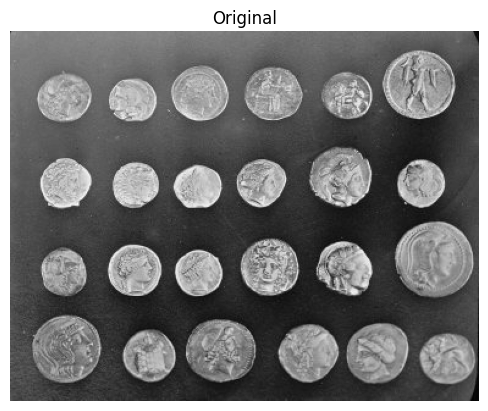

In [124]:
show_image(image_coins, 'Original')

In [125]:
# Apply edge detection filter
edge_sobel = sobel(image_coins)

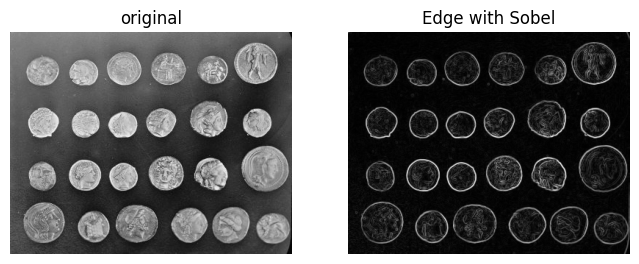

In [126]:
plot_comparison(image_coins, edge_sobel, 'Edge with Sobel' )

## Gaussian Smoothing

In [127]:
#import the module and function
from skimage.filters import gaussian

In [128]:
coffee_image = data.coffee()

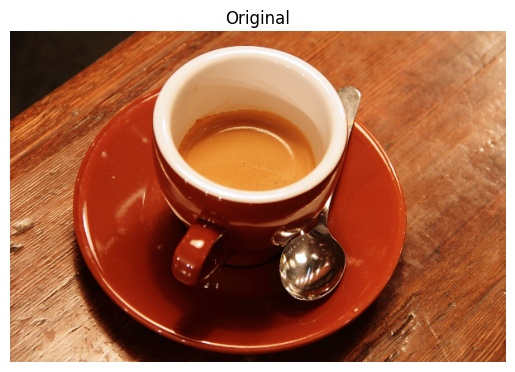

In [129]:
show_image(coffee_image, 'Original')

In [130]:
# Apply edge detection filter
# multichannel is set to true if the image is colored otherwise false
gaussian_image = gaussian(coffee_image, multichannel=True) 

/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/2025459769.py:3: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  gaussian_image = gaussian(coffee_image, multichannel=True)


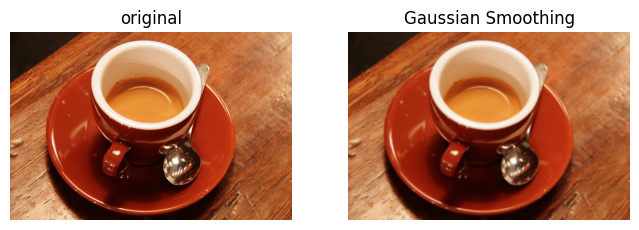

In [131]:
plot_comparison(coffee_image, gaussian_image, 'Gaussian Smoothing')

In [132]:
path = '/Users/tuba/Desktop/data_science/datacamp/Image_Processing_in_Python/FiltersContrastTransformationandMorphology'

In [133]:
soaps_image = plt.imread(path + '/soap_image.jpeg')

We'll detect edges in an image by applying the Sobel filter.

Soap pills of heart and rectangle shapes in blue background

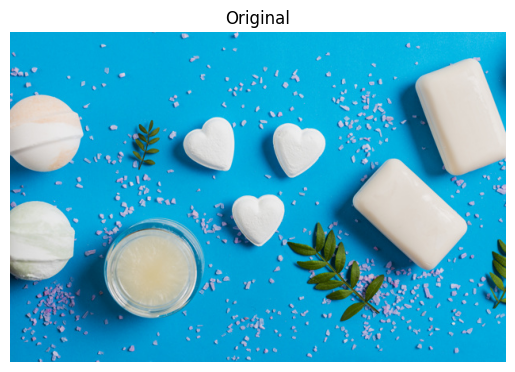

In [134]:
show_image(soaps_image, 'Original')

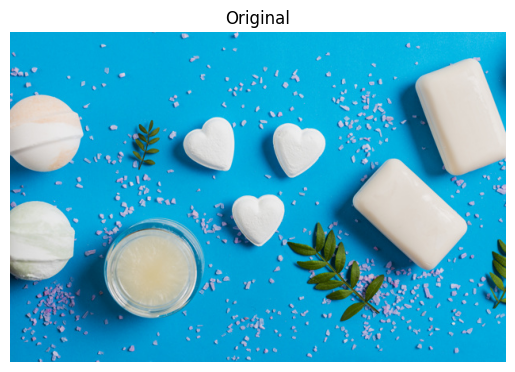

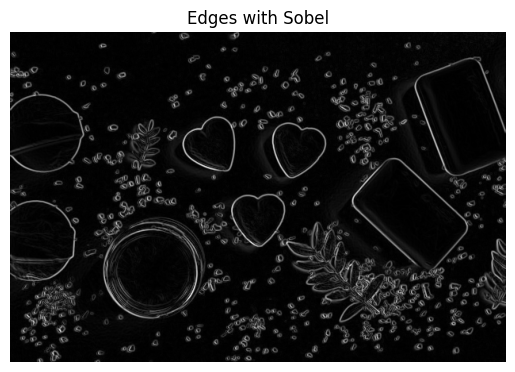

In [135]:
# Import the color module
from skimage import color

# Import the filters module and sobel function
from skimage.filters import sobel

# Make the image grayscale
soaps_image_gray = color.rgb2gray(soaps_image)

# Apply edge detection filter
edge_sobel = sobel(soaps_image_gray)

# Show original and resulting image to compare
show_image(soaps_image, "Original")
show_image(edge_sobel, "Edges with Sobel")

## Blurring to reduce noise
Now, we will reduce the sharpness of an image of a building taken during a London trip, through filtering.

In [136]:
building_image = plt.imread(path + '/building.jpeg')

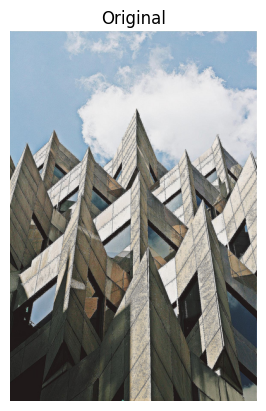

In [137]:
show_image(building_image, 'Original')

/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/1083388465.py:2: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  gaussian_image = gaussian(building_image,multichannel=True)


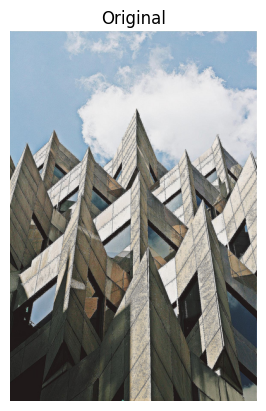

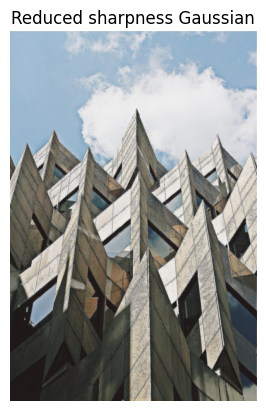

In [138]:
# Apply filter
gaussian_image = gaussian(building_image,multichannel=True)

# Show original and resulting image to compare
show_image(building_image, "Original")
show_image(gaussian_image, "Reduced sharpness Gaussian")

# Contrast Enhancement

We can calculate the contrast by calculating the range of the pixel intensities i.e. by subtracting the minimum pixel intensity value from the histogram to the maximum one.

We can obtain the maximum pixel intensity of the image by using the np.max() method from NumPy and the minimum with np.min() in the console.

## Histogram Equalization

In [139]:
from skimage import exposure

# Obtain the equalized image
image_eq = exposure.equalize_hist(soaps_image)

# Apply adaptive Equalization
# clip_limit = number between 0 and 1 , higher values give more contrast
image_adapteq = exposure.equalize_adapthist(soaps_image, clip_limit = 0.03) 

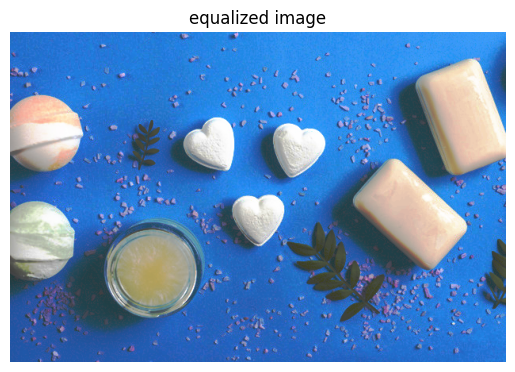

In [140]:
show_image(image_eq,"equalized image")

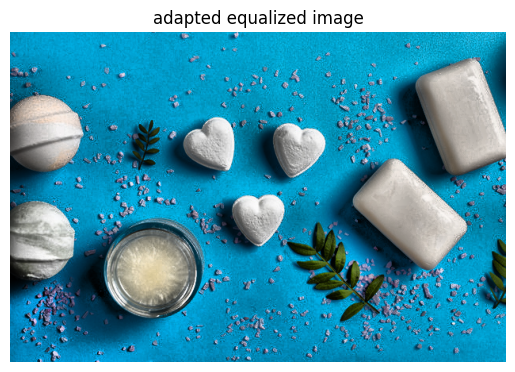

In [141]:
show_image(image_adapteq,"adapted equalized image")

**Medical images**
We are trying to improve the tools of a hospital by pre-processing the X-ray images so that doctors have a higher chance of spotting relevant details. We'll test our code on a chest X-ray image from the National Institutes of Health Chest X-Ray Dataset
X-ray chest image.

Image loaded as chest_xray_image.
First, we'll check the histogram of the image and then apply standard histogram equalization to improve the contrast.

In [142]:
chest_xray_image = plt.imread(path +'/chest_xray.png')

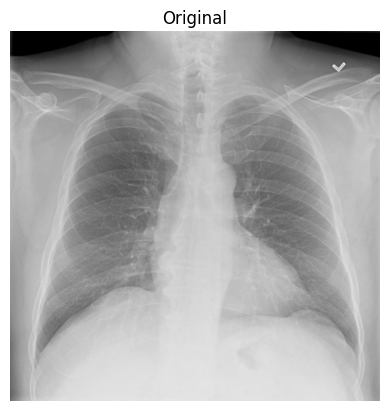

In [143]:
show_image(chest_xray_image,'Original')

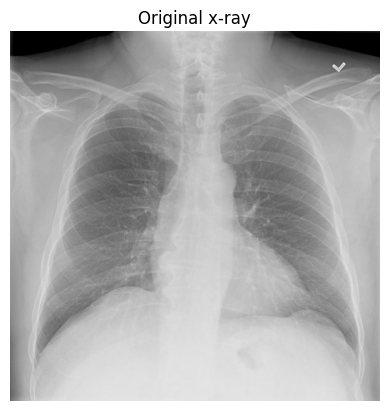

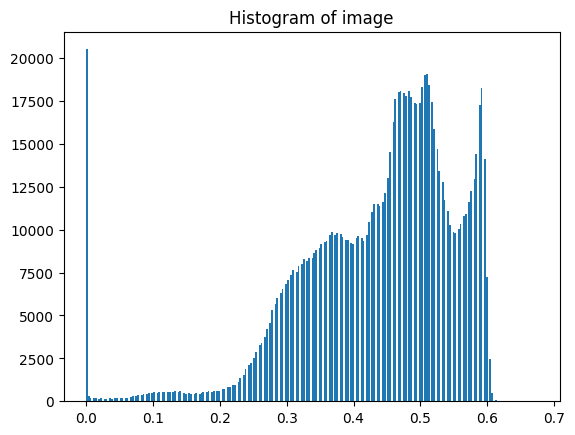

In [144]:
# Show original x-ray image and its histogram
show_image(chest_xray_image, 'Original x-ray')

plt.title('Histogram of image')
plt.hist(chest_xray_image.ravel(), bins=256)
plt.show()

In [145]:
# Use histogram equalization to improve the contrast
xray_image_eq =  exposure.equalize_hist(chest_xray_image)

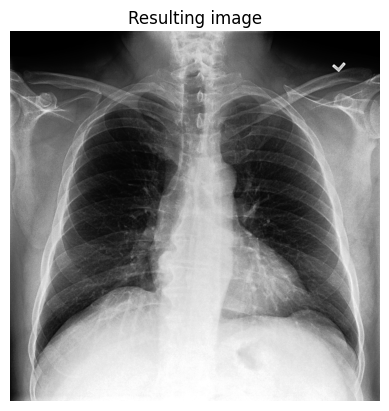

In [146]:
# Show the resulting image
show_image(xray_image_eq, 'Resulting image')

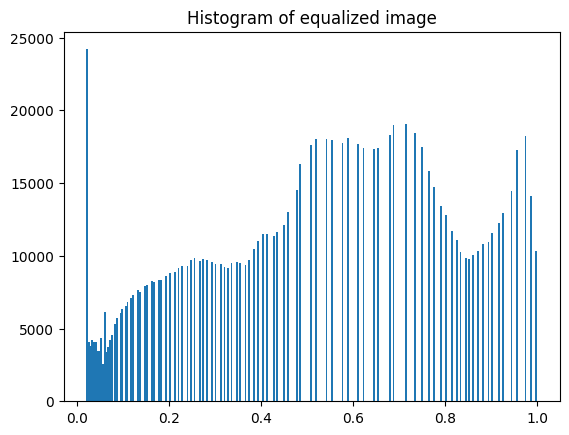

In [147]:
plt.title('Histogram of equalized image')
plt.hist(xray_image_eq.ravel(), bins=256)
plt.show()

### Aerial image
Now, we will improve the quality of an aerial image of a city. The image has low contrast and therefore we can not distinguish all the elements in it.

For this we will use the normal or standard technique of Histogram Equalization.

In [148]:
image_aerial = plt.imread(path + '/image_aerial.png')

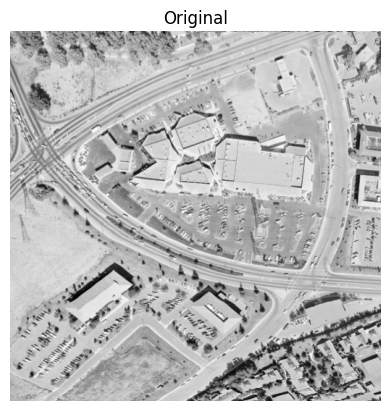

In [149]:
show_image(image_aerial, 'Original')

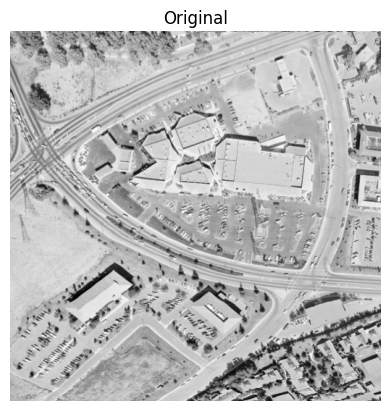

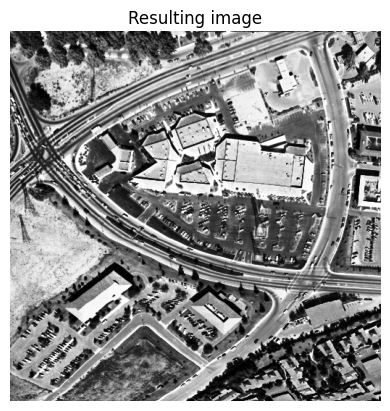

In [150]:
# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_hist(image_aerial)

# Show the original and resulting image
show_image(image_aerial, 'Original')
show_image(image_eq, 'Resulting image')

### Some impact and contrast to a cup of coffee image

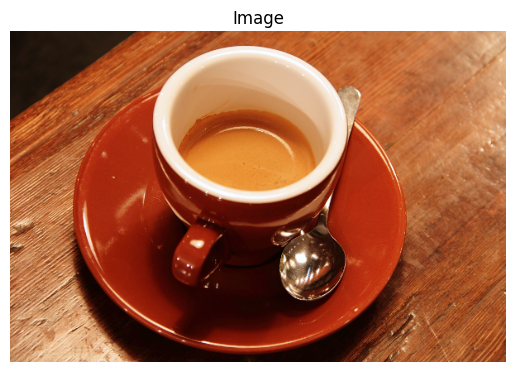

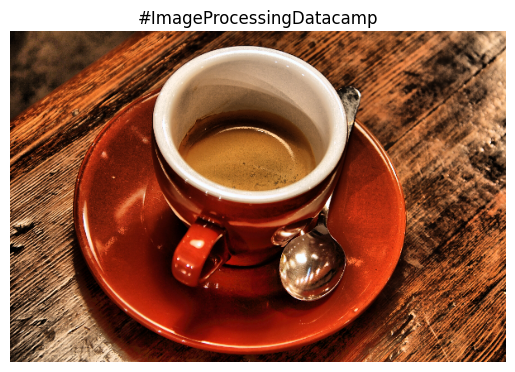

In [151]:
# Load the image
original_image = data.coffee()

# Apply the adaptive equalization on the original image
adapthist_eq_image = exposure.equalize_adapthist(original_image, clip_limit=0.03)

# Compare the original image to the equalized
show_image(original_image)
show_image(adapthist_eq_image, '#ImageProcessingDatacamp')

# Transformations

In [173]:
def show_image(image, title = 'Image', cmap_type = 'gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    #plt.axis('off')
    plt.show()

In [174]:
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8,6), sharex= True, sharey = True)
    ax1.imshow(original, cmap = plt.cm.gray)
    ax1.set_title('original')
    #ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    #ax2.axis('off')

## Rotating Clockwise

In [175]:
from skimage.transform import rotate

In [176]:
cat_image = data.cat()

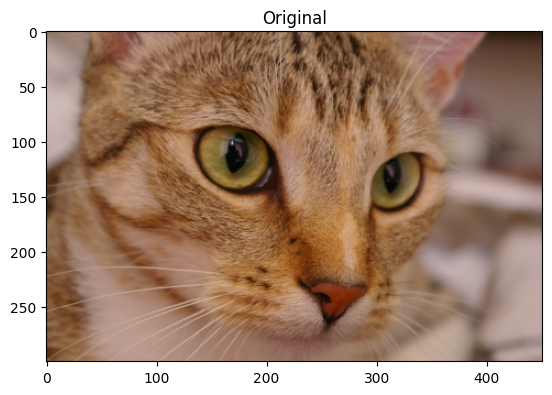

In [177]:
show_image(cat_image, 'Original')

In [178]:
# Rotate the image 90 degrees clockwise
image_rotated = rotate(cat_image, -90)

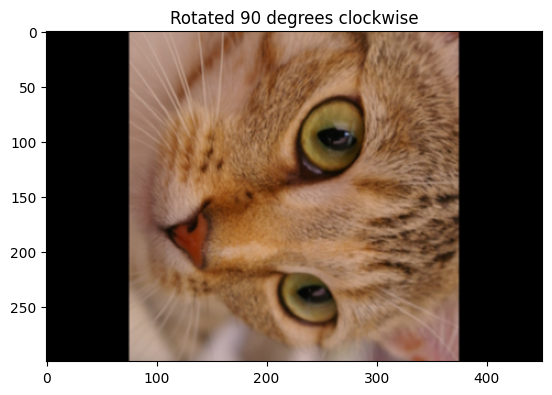

In [179]:
show_image(image_rotated, 'Rotated 90 degrees clockwise')

## Rotating AntiClockwise

In [180]:
# Rotate the image 90 degrees clockwise
image_rotated = rotate(cat_image, 90)

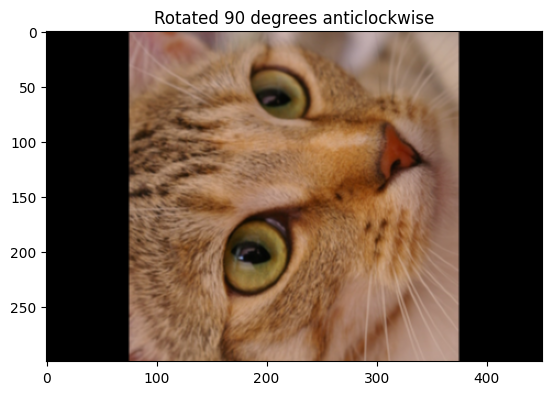

In [181]:
show_image(image_rotated, 'Rotated 90 degrees anticlockwise')

## Rescaling
#### Downgrading

In [182]:
from skimage.transform import rescale

In [183]:
# Rescale the image to be 4 times smaller
#scaling factor= 1/4
#anti_aliasing = true : apply a filter to smooth the image prior to downscaling
image_rescaled = rescale(cat_image, 1/4, anti_aliasing= True, multichannel= True) 

/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/4147979283.py:4: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  image_rescaled = rescale(cat_image, 1/4, anti_aliasing= True, multichannel= True)


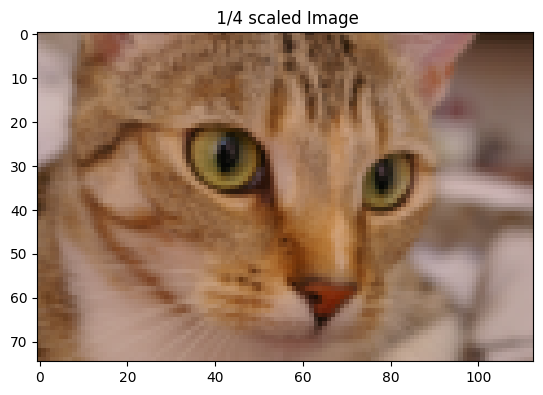

In [184]:
show_image(image_rescaled, " 1/4 scaled Image")

## Resizing

In [185]:
from skimage.transform import resize

In [186]:
# Height and width to resize
height = 400
width = 500

#Resize image
image_resized = resize(cat_image, (height,width), anti_aliasing=True)

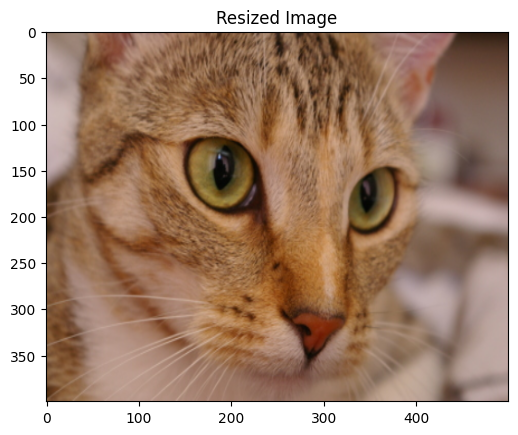

In [187]:
show_image(image_resized, 'Resized Image')

## Resizing Proportionally

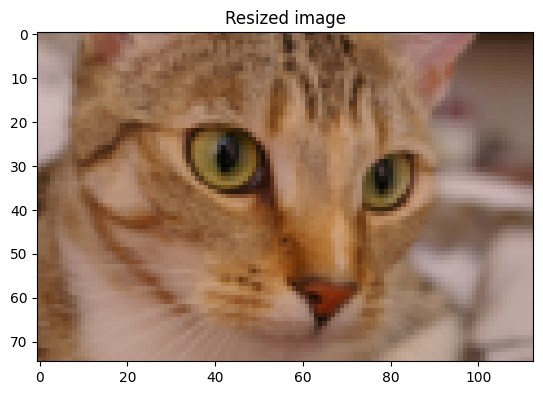

In [188]:
# Set proportional height so its 4 times its size
height = cat_image.shape[0] /4
width = cat_image.shape[1] /4

#Resize image
image_resized = resize(cat_image, (height, width), anti_aliasing= True)

show_image(image_resized, 'Resized image')

#### Aliasing, rotating and rescaling
Aliasing is an effect that causes different signals, in this case pixels, to become indistinguishable or distorted.

We'll make this cat image upright by rotating it 90 degrees and then rescaling it two times. Once with the anti aliasing filter applied before rescaling and a second time without it, so we can compare them.

In [189]:
image_kitty = plt.imread(path + '/kitty2.jpeg')

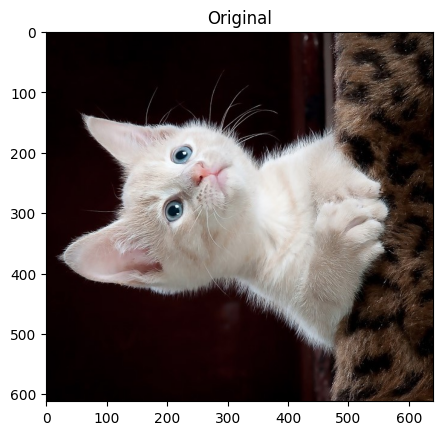

In [190]:
show_image(image_kitty, 'Original')

In [191]:
# Rotate the image 90 degrees clockwise 
rotated_cat_image = rotate(image_kitty, -90)

In [192]:
# Rescale with anti aliasing
rescaled_with_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=True, multichannel=True)

/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/645880257.py:2: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  rescaled_with_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=True, multichannel=True)


/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/4169561308.py:2: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  rescaled_without_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=False, multichannel=True)


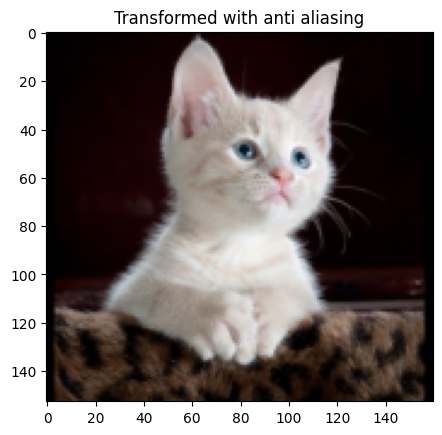

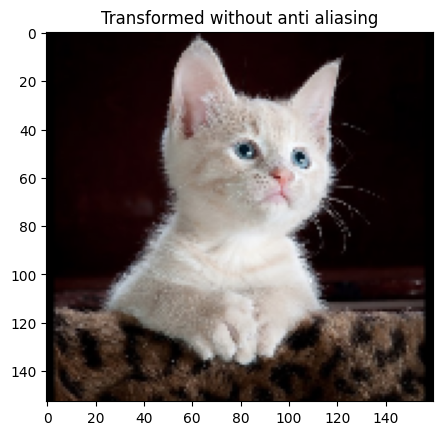

In [193]:
# Rescale without anti aliasing
rescaled_without_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=False, multichannel=True)

# Show the resulting images
show_image(rescaled_with_aa, "Transformed with anti aliasing")
show_image(rescaled_without_aa, "Transformed without anti aliasing")

#### Enlarging images
Have you ever tried resizing an image to make it larger? This usually results in loss of quality, with the enlarged image looking blurry.

The good news is that the algorithm used by scikit-image works very well for enlarging images up to a certain point.

Now, we'll enlarge an image three times!!


/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/1111057461.py:5: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  enlarged_rocket_image = rescale(rocket_image,3/1, anti_aliasing=True, multichannel=True)


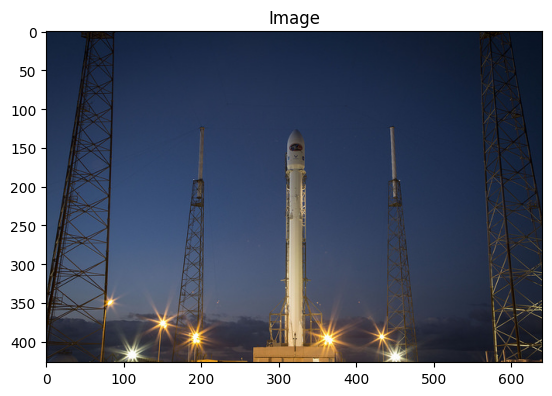

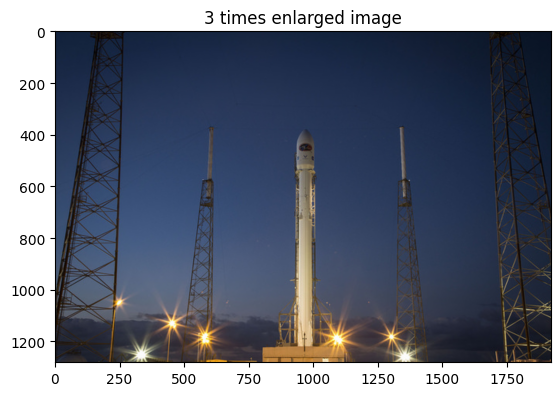

In [194]:
# Load the image from data
rocket_image = data.rocket()

# Enlarge the image so it is 3 times bigger
enlarged_rocket_image = rescale(rocket_image,3/1, anti_aliasing=True, multichannel=True)

# Show original and resulting image
show_image(rocket_image)
show_image(enlarged_rocket_image, "3 times enlarged image")

#### Proportionally resizing
We want to downscale the images of a veterinary blog website so all of them have the same compressed size.

It's important that you do this proportionally, meaning that these are not distorted.

First, we'll try it out for one image so we know what code to test later in the rest of the pictures.


In [198]:
dogs_banner = plt.imread(path + '/dogs.jpeg')

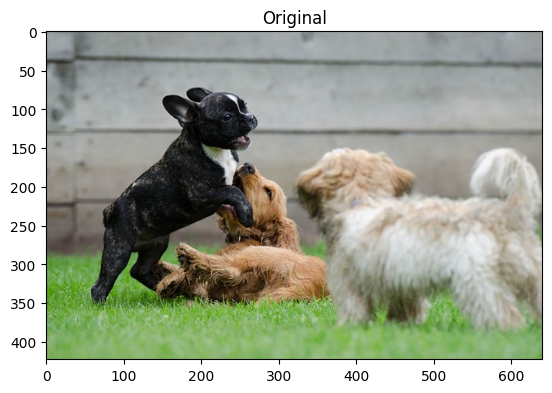

In [199]:
show_image(dogs_banner,'Original')

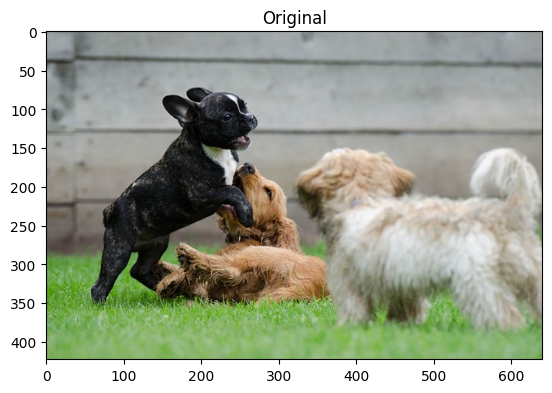

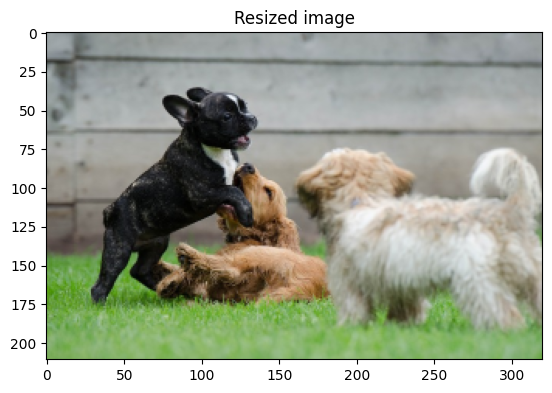

In [200]:
# Set proportional height so its half its size
height = int(dogs_banner.shape[0] / 2)
width = int(dogs_banner.shape[1] / 2)

# Resize using the calculated proportional height and width
image_resized = resize(dogs_banner, (height, width),
                       anti_aliasing=True)

# Show the original and resized image
show_image(dogs_banner, 'Original')
show_image(image_resized, 'Resized image')

## Morphology

In [201]:
from skimage import morphology

In [202]:
square = morphology.square(4)
rectangle = morphology.rectangle(4,2)

In [203]:
square

array([[1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1]], dtype=uint8)

In [205]:
rectangle

array([[1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=uint8)

## Erosion in scikit_image

In [206]:
image_horse = data.horse()

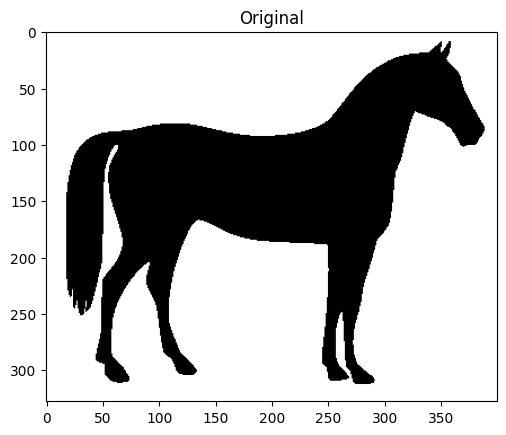

In [207]:
show_image(image_horse, 'Original')

In [216]:
# Set structuring element to the rectangular-shaped
selem = morphology.rectangle(12,6)

#Obtain the erosed image with binary erosion
eroded_image = morphology.binary_erosion(image_horse, selem = selem)

/var/folders/69/7fyqgvhj7yqctsqk4wr745jc0000gn/T/ipykernel_33721/3781212734.py:5: FutureWarning: `selem` is a deprecated argument name for `binary_erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  eroded_image = morphology.binary_erosion(image_horse, selem = selem)


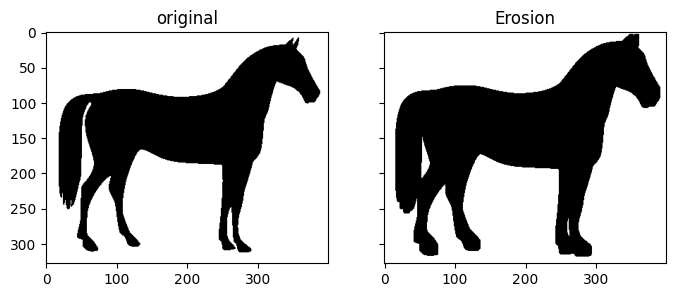

In [217]:
plot_comparison(image_horse, eroded_image, 'Erosion')

### Binary Erosion with default selem

In [218]:
eroded_image = morphology.binary_erosion(image_horse)

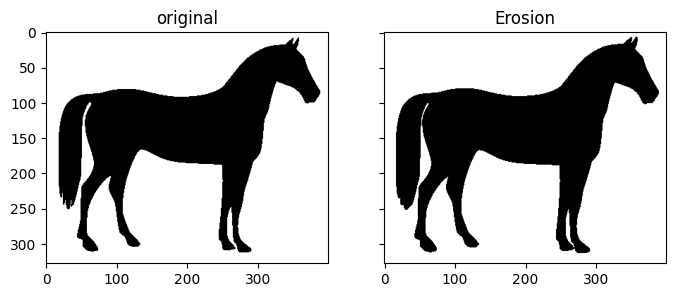

In [219]:
plot_comparison(image_horse, eroded_image, 'Erosion')

## Dilation in scikit_image

In [220]:
# Obtain dilated image, using binary dilation
dilated_image = morphology.binary_dilation(image_horse)

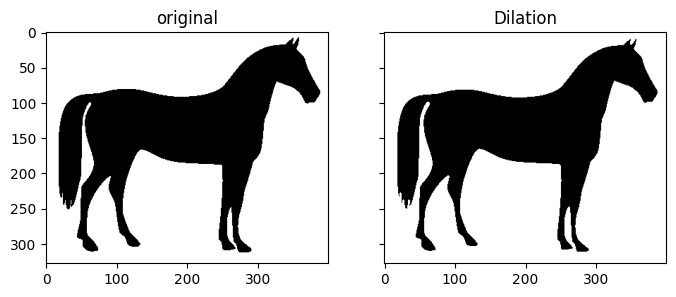

In [221]:
plot_comparison(image_horse,dilated_image, 'Dilation')

#### Handwritten letters
A very interesting use of computer vision in real-life solutions is performing Optical Character Recognition (OCR) to distinguish printed or handwritten text characters inside digital images of physical documents.

Let's try to improve the definition of this handwritten letter so that it's easier to classify.

As we can see it's the letter R, already binary, with some noise in it. 

Apply the morphological operation that will discard the pixels near the letter boundaries.

In [231]:
upper_r_image = plt.imread(path + '/r_image.jpeg')

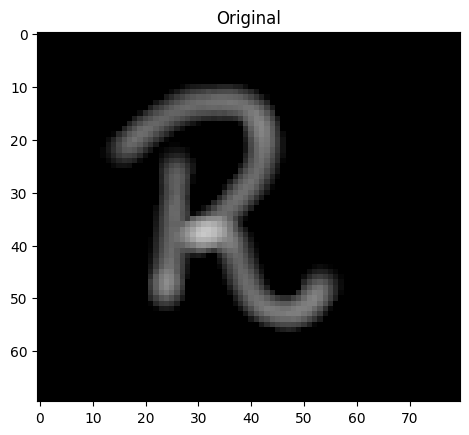

In [232]:
show_image(upper_r_image, 'Original')

In [230]:
data.astronaut()

array([[[154, 147, 151],
        [109, 103, 124],
        [ 63,  58, 102],
        ...,
        [127, 120, 115],
        [120, 117, 106],
        [125, 119, 110]],

       [[177, 171, 171],
        [144, 141, 143],
        [113, 114, 124],
        ...,
        [127, 118, 112],
        [124, 115, 108],
        [121, 116, 105]],

       [[201, 194, 193],
        [182, 178, 175],
        [168, 165, 164],
        ...,
        [128, 120, 117],
        [126, 116, 112],
        [124, 114, 109]],

       ...,

       [[186, 170, 176],
        [186, 170, 177],
        [183, 168, 170],
        ...,
        [  0,   0,   0],
        [  0,   0,   1],
        [  0,   0,   0]],

       [[183, 169, 170],
        [182, 167, 171],
        [185, 164, 176],
        ...,
        [  0,   0,   1],
        [  1,   1,   1],
        [  0,   0,   0]],

       [[184, 167, 172],
        [183, 165, 169],
        [180, 162, 171],
        ...,
        [  0,   0,   0],
        [  1,   1,   1],
        [  0,   0,   0]]

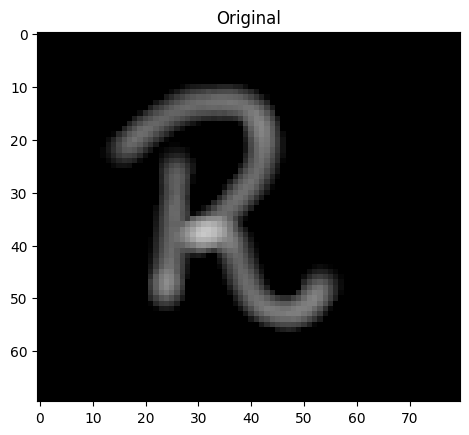

ValueError: Unsupported dtype

<Figure size 640x480 with 1 Axes>

In [233]:
# Obtain the eroded shape 
eroded_image_shape = morphology.binary_erosion(upper_r_image) 

# See results
show_image(upper_r_image, 'Original')
show_image(eroded_image_shape, 'Eroded image')

#### Improving thresholded image
 we'll try to reduce the noise of a thresholded image using the dilation morphological operation.
 This operation, in a way, expands the objects in the image.

In [234]:
world_image = plt.imread(path + '/world_image_binary.jpeg')

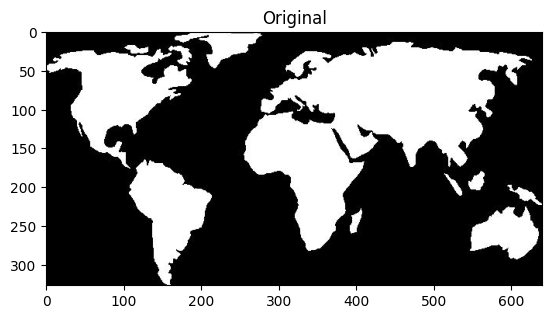

In [235]:
show_image(world_image, 'Original')

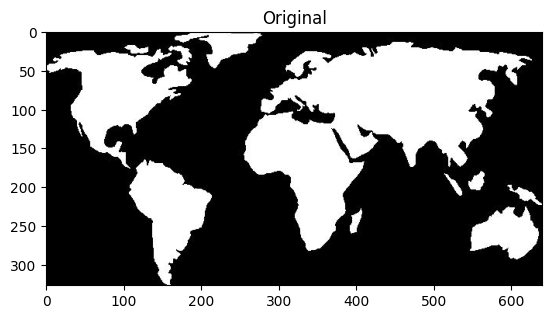

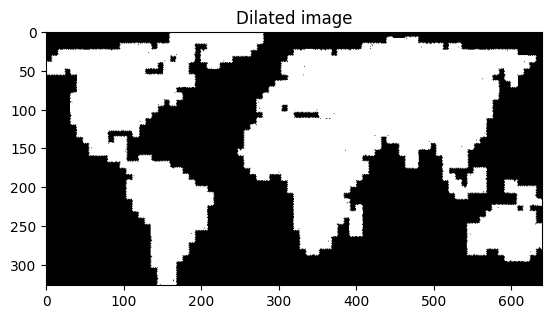

In [236]:
# Import the module
from skimage import morphology

# Obtain the dilated image 
dilated_image = morphology.binary_dilation(world_image)

# See results
show_image(world_image, 'Original')
show_image(dilated_image, 'Dilated image')

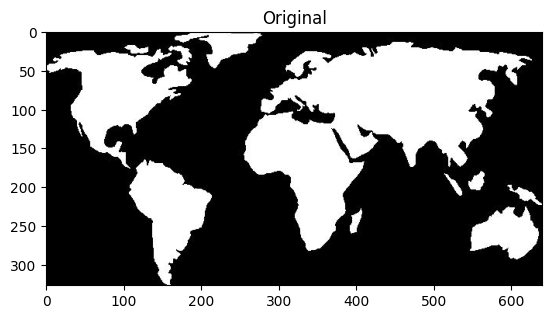

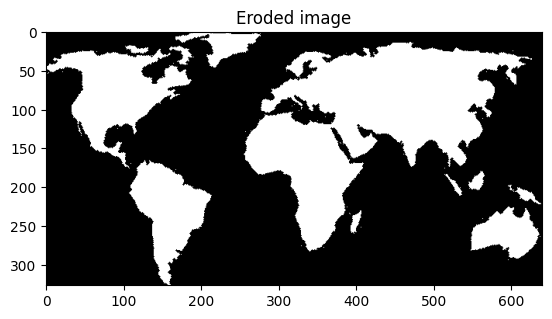

In [237]:
# Obtain the eroded shape 
eroded_image_shape = morphology.binary_erosion(world_image) 

# See results
show_image(world_image, 'Original')
show_image(eroded_image_shape, 'Eroded image')